<a href="https://colab.research.google.com/github/bedhinesh/capstone-aiml/blob/subrahmanya/Copy_of_Capstone_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [85]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [86]:
project_path = r'/content/drive/MyDrive/CapstoneProject/Data/'

In [33]:
import pandas as pd
import numpy as np
import csv
DATASET_FOLDER_TRAIN = project_path +"car_data/car_data/train/"
DATASET_FOLDER_TEST = "car_data/car_data/test/"
TRAIN_CSV = project_path + "anno_train.csv"
TEST_CSV = project_path + "anno_test.csv"
DATA_LABELS = np.array(pd.read_csv(project_path+'names.csv',\
                                   header = None))

In [81]:
import numpy as np
import csv

with open(TRAIN_CSV, "r") as f:
  
  y_train = np.zeros((sum(1 for line in f), 5))
  X_train = []
  z_train = []
  f.seek(0)
  data = csv.reader(f, delimiter=',')
  for index, row in enumerate(data):
    for i, r in enumerate(row[1:7]):
      row[i+1] = int(r)
    path, x0, y0, x1, y1, car_ref = row       # Read image, its dimensions, BBox coords
    path = DATASET_FOLDER_TRAIN + DATA_LABELS[car_ref-1][0] + '/'+path
    #y_train[index, 0] = x0 * IMAGE_SIZE / image_width                 # Normalize bounding box by image size
    #y_train[index, 1] = y0 * IMAGE_SIZE / image_height                # Normalize bounding box by image size
    #y_train[index, 2] = (x1 - x0) * IMAGE_SIZE / image_width          # Normalize bounding box by image size
    #y_train[index, 3] = (y1 - y0) * IMAGE_SIZE / image_height         # Normalize bounding box by image size
    y_train[index, 0] = x0               # Normalize bounding box by image size
    y_train[index, 1] = y0              # Normalize bounding box by image size
    y_train[index, 2] = (x1 - x0)          # Normalize bounding box by image size
    y_train[index, 3] = (y1 - y0)       # Normalize bounding box by image size
    y_train[index, 4] = int(car_ref)
    X_train.append(path)                 

In [5]:
X_train[:5]

['/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Audi TTS Coupe 2012/00001.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Acura TL Sedan 2012/00002.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Dodge Dakota Club Cab 2007/00003.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Hyundai Sonata Hybrid Sedan 2012/00004.jpg',
 '/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Ford F-450 Super Duty Crew Cab 2012/00005.jpg']

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Cadillac CTS-V Sedan 2012/00098.jpg


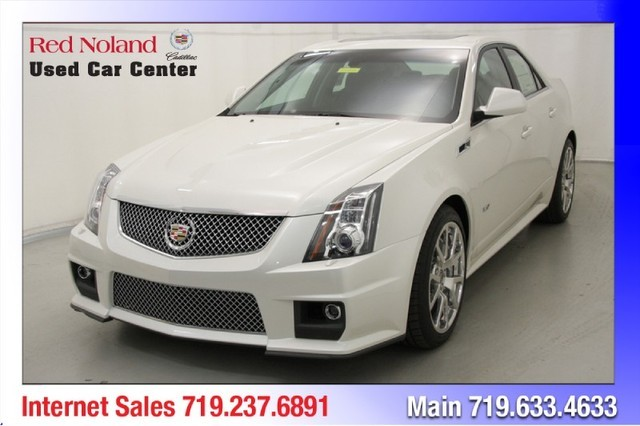

In [6]:
import cv2
from google.colab.patches import cv2_imshow
# Pick a random image to check how it looks
filename = X_train[97]
print(filename)
unscaled = cv2.imread(filename)

cv2_imshow(unscaled) 

region = y_train[97]
x0 = region[0]
y0 = region[1]

x1 = (region[0] + region[2])
y1 = (region[1] + region[3])

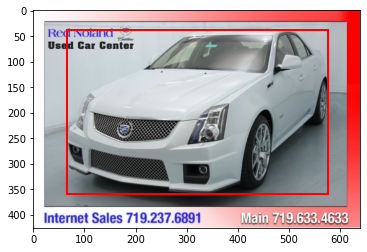

In [7]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Dodge Dakota Club Cab 2007/00003.jpg


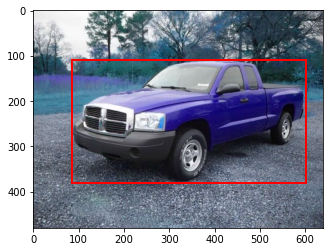

In [ ]:
# Pick a random image to check how it looks
filename = X_train[2]
print(filename)
unscaled = cv2.imread(filename)

region = y_train[2]
x0 = region[0]
y0 = region[1]

x1 = (region[0] + region[2])
y1 = (region[1] + region[3])

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Audi RS 4 Convertible 2008/00201.jpg


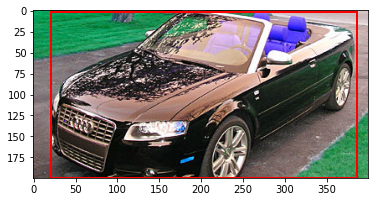

In [ ]:
# Pick a random image to check how it looks
filename = X_train[200]
print(filename)
unscaled = cv2.imread(filename)
region = y_train[200]
x0 = region[0]
y0 = region[1]

x1 = (region[0] + region[2])
y1 = (region[1] + region[3])

# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(unscaled)

# Create a Rectangle patch
rect = patches.Rectangle((x0, y0), x1 - x0, y1 - y0, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
imag_ab = ax.add_patch(rect)
imag_ab
plt.show()

In [58]:
path = '/content/drive/MyDrive/CapstoneProject/Data/SampleAug'
import imageio
import imgaug as ia
from imgaug import augmenters as iaa 
ia.seed(2)

seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Crop(percent=(0, 0.1)),
    iaa.Affine(rotate=(-25,25))
], random_order=True)

for folder in os.listdir(path):
    i = 0
    for fname in os.listdir(path):
        if filename.endswith(".jpg"):
          print('Original:')
          ia.imshow(img)
          img_aug = seq.augment_image(img)
          print('Augmented:')
          ia.imshow(img_aug)
        
          imageio.imwrite(os.path.join(path, path + '\\' + folder + '\\' + folder + "%06d.jpg" % (i,)), img_aug)
        i += 1

Original:


NameError: ignored

In [48]:
for folder in os.listdir(path):
    i = 0
    for fname in os.listdir(path + '\\' + folder):

SyntaxError: ignored

In [ ]:
print(X_train[2])

/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/Dodge Dakota Club Cab 2007/00003.jpg


In [ ]:
print(y_train[2])
print(DATA_LABELS[int(y_train[2][4])-1][0])

[ 85. 109. 516. 272.  91.]
Dodge Dakota Club Cab 2007


Exploratory Data Analysis - Train Data


In [ ]:
df_train=pd.read_csv(TRAIN_CSV, header=None)

df_train.columns =['Image', 'x0', 'y0', 'x1', 'y1','Car_ref'] 
df_test=pd.read_csv(TEST_CSV, header=None)
df_test.columns =['Image', 'x0', 'y0', 'x1', 'y1','Car_ref'] 

In [ ]:
df_train.shape

(8144, 6)

In [ ]:
df_test.shape


(8041, 6)

In [ ]:
df_train.head()


,Image,x0,y0,x1,y1,Car_ref
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Image    8144 non-null   object
 1   x0       8144 non-null   int64 
 2   y0       8144 non-null   int64 
 3   x1       8144 non-null   int64 
 4   y1       8144 non-null   int64 
 5   Car_ref  8144 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 381.9+ KB


In [ ]:
## Some names contain '/' like 155 record in train data as the file location has - instead of /
## We will have to replace this with '-' since the folder location in data has '-'
# adding car name to train
df_train["Car_name"] = ''
df_test["Car_name"] = ''
i=0
for ref in df_train["Car_ref"]:
  ref=DATA_LABELS[ref-1][0]
  df_train["Car_name"][i] = ref.replace("/" ,"-")## We will have to replace this with '-' since the folder location in data has '-'
  i=i+1
# adding car name to test
i=0
for ref in df_test["Car_ref"]:
  ref=DATA_LABELS[ref-1][0]
  df_test["Car_name"][i] = ref.replace("/" ,"-")## We will have to replace this with '-' since the folder location in data has '-'
  i=i+1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


In [8]:
df_train.head()

NameError: ignored

In [ ]:
df_test.head()

,Image,x0,y0,x1,y1,Car_ref,Car_name
0,00001.jpg,30,52,246,147,181,Suzuki Aerio Sedan 2007
1,00002.jpg,100,19,576,203,103,Ferrari 458 Italia Convertible 2012
2,00003.jpg,51,105,968,659,145,Jeep Patriot SUV 2012
3,00004.jpg,67,84,581,407,187,Toyota Camry Sedan 2012
4,00005.jpg,140,151,593,339,185,Tesla Model S Sedan 2012


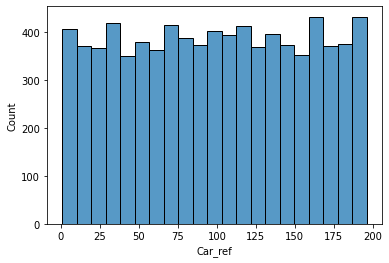

In [ ]:
#train data split
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.histplot(df_train['Car_ref'])
print()

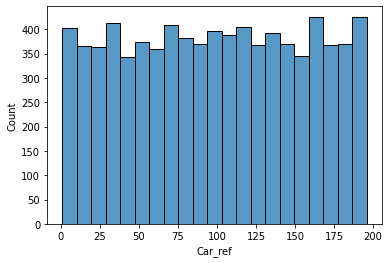

In [ ]:
#test data split
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.histplot(df_test['Car_ref'])
print()

In [ ]:
df_train.Car_name.value_counts()

GMC Savana Van 2012                                    68
Chrysler 300 SRT-8 2010                                49
Mitsubishi Lancer Sedan 2012                           48
Mercedes-Benz 300-Class Convertible 1993               48
Jaguar XK XKR 2012                                     47
                                                       ..
Rolls-Royce Phantom Drophead Coupe Convertible 2012    31
Chevrolet Express Cargo Van 2007                       30
Maybach Landaulet Convertible 2012                     29
FIAT 500 Abarth 2012                                   28
Hyundai Accent Sedan 2012                              24
Name: Car_name, Length: 196, dtype: int64

In [ ]:
df_test.Car_name.value_counts()

GMC Savana Van 2012                                    68
Mercedes-Benz 300-Class Convertible 1993               48
Chrysler 300 SRT-8 2010                                48
Mitsubishi Lancer Sedan 2012                           47
Jaguar XK XKR 2012                                     46
                                                       ..
Rolls-Royce Phantom Drophead Coupe Convertible 2012    30
Maybach Landaulet Convertible 2012                     29
Chevrolet Express Cargo Van 2007                       29
FIAT 500 Abarth 2012                                   27
Hyundai Accent Sedan 2012                              24
Name: Car_name, Length: 196, dtype: int64

In [ ]:
# Adding file location to the Train df
df_train['File_loc']='/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train/'+df_train['Car_name']+'/'+df_train['Image']
df_train.head()

KeyError: ignored

In [ ]:
# Adding file location to the test df
df_test['File_loc']='/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/test/'+df_test['Car_name']+'/'+df_test['Image']
df_test.head()


,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc
0,00001.jpg,30,52,246,147,181,Suzuki Aerio Sedan 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...
1,00002.jpg,100,19,576,203,103,Ferrari 458 Italia Convertible 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...
2,00003.jpg,51,105,968,659,145,Jeep Patriot SUV 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...
3,00004.jpg,67,84,581,407,187,Toyota Camry Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...
4,00005.jpg,140,151,593,339,185,Tesla Model S Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...


In [ ]:
# Adding Car_type and Year to the train and test data set
# train
df_train["Car_type"] = ''
df_train["Year"] = ''
i=0
for ref in df_train["Car_name"]:
  words = ref.split()
  df_train["Car_type"][i] = words[-2]
  df_train["Year"][i] = words[-1]
  i=i+1
# test
df_test["Car_type"] = ''
df_test["Year"] = ''
i=0
for ref in df_test["Car_name"]:
  words = ref.split()
  df_test["Car_type"][i] = words[-2]
  df_test["Year"][i] = words[-1]
  i=i+1



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWa

In [34]:
df_train.head()

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900
2,2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2007,480,640
3,3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,1386,2100
4,4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2012,108,144


In [35]:
df_test.head()

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,30,52,246,147,181,Suzuki Aerio Sedan 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2007,182,276
1,1,00002.jpg,100,19,576,203,103,Ferrari 458 Italia Convertible 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Convertible,2012,360,640
2,2,00003.jpg,51,105,968,659,145,Jeep Patriot SUV 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,SUV,2012,741,1024
3,3,00004.jpg,67,84,581,407,187,Toyota Camry Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,480,640
4,4,00005.jpg,140,151,593,339,185,Tesla Model S Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,373,600


In [ ]:
# Adding height and width to the train data set
df_train["Height"] = ''
df_train["Width"] = ''
i=0
for ref in df_train["File_loc"]:
  image = cv2.imread(ref)
  df_train["Height"][i] = image.shape[0]
  df_train["Width"][i] = image.shape[1]
  i=i+1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# Adding height and width to the test data set
df_test["Height"] = ''
df_test["Width"] = ''
i=0
for ref in df_test["File_loc"]:
  image = cv2.imread(ref)
  df_test["Height"][i] = image.shape[0]
  df_test["Width"][i] = image.shape[1]
  i=i+1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# saving the dataframe 
#df_train.to_csv('/content/drive/MyDrive/CapstoneProject/Data/df_train.csv') 

In [ ]:
# saving the dataframe 
#df_test.to_csv('/content/drive/MyDrive/CapstoneProject/Data/df_train.csv')

In [87]:
df_train=pd.read_csv('/content/drive/MyDrive/CapstoneProject/Data/df_train.csv')

In [88]:
df_train.head()

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900
2,2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2007,480,640
3,3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,1386,2100
4,4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2012,108,144


In [89]:
df_test=pd.read_csv('/content/drive/MyDrive/CapstoneProject/Data/df_test.csv')

In [90]:
df_test.head()

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,30,52,246,147,181,Suzuki Aerio Sedan 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2007,182,276
1,1,00002.jpg,100,19,576,203,103,Ferrari 458 Italia Convertible 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Convertible,2012,360,640
2,2,00003.jpg,51,105,968,659,145,Jeep Patriot SUV 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,SUV,2012,741,1024
3,3,00004.jpg,67,84,581,407,187,Toyota Camry Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,480,640
4,4,00005.jpg,140,151,593,339,185,Tesla Model S Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,373,600


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


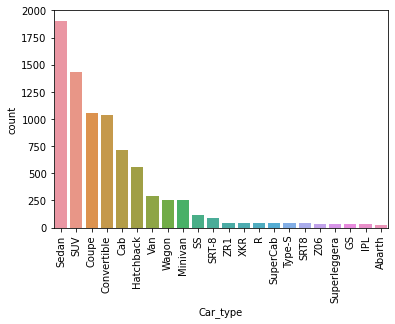

In [14]:
#train data count cartype
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_train['Car_type'],order=df_train['Car_type'].value_counts().index)
plt.xticks(rotation=90)
print()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


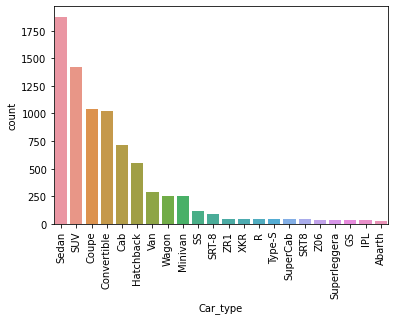

In [ ]:
#test data count cartype
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_test['Car_type'],order=df_test['Car_type'].value_counts().index)
plt.xticks(rotation=90)
print()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


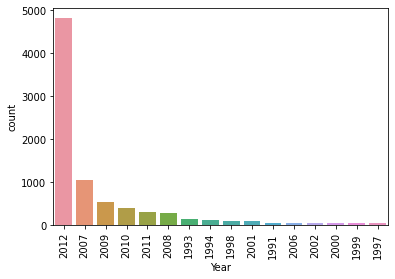

In [ ]:
#train data count year wise
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_train['Year'],order=df_train['Year'].value_counts().index)
plt.xticks(rotation=90)
print()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


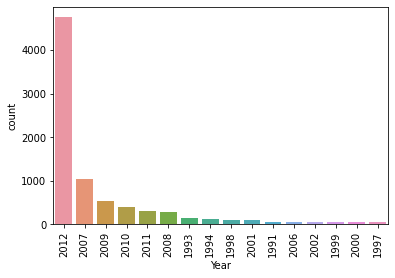

In [ ]:
#train data count year wise
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
sns.countplot(df_test['Year'],order=df_test['Year'].value_counts().index)
plt.xticks(rotation=90)
print()

In [ ]:
df_train.head(2)

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900


In [ ]:
import cv2
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV )
        if img is not None:
            images.append(img)
    return images
folder="/content/drive/MyDrive/CapstoneProject/Data/SampleAug"


In [ ]:
aug_data = load_images_from_folder(folder)

In [ ]:
len(aug_data)

21

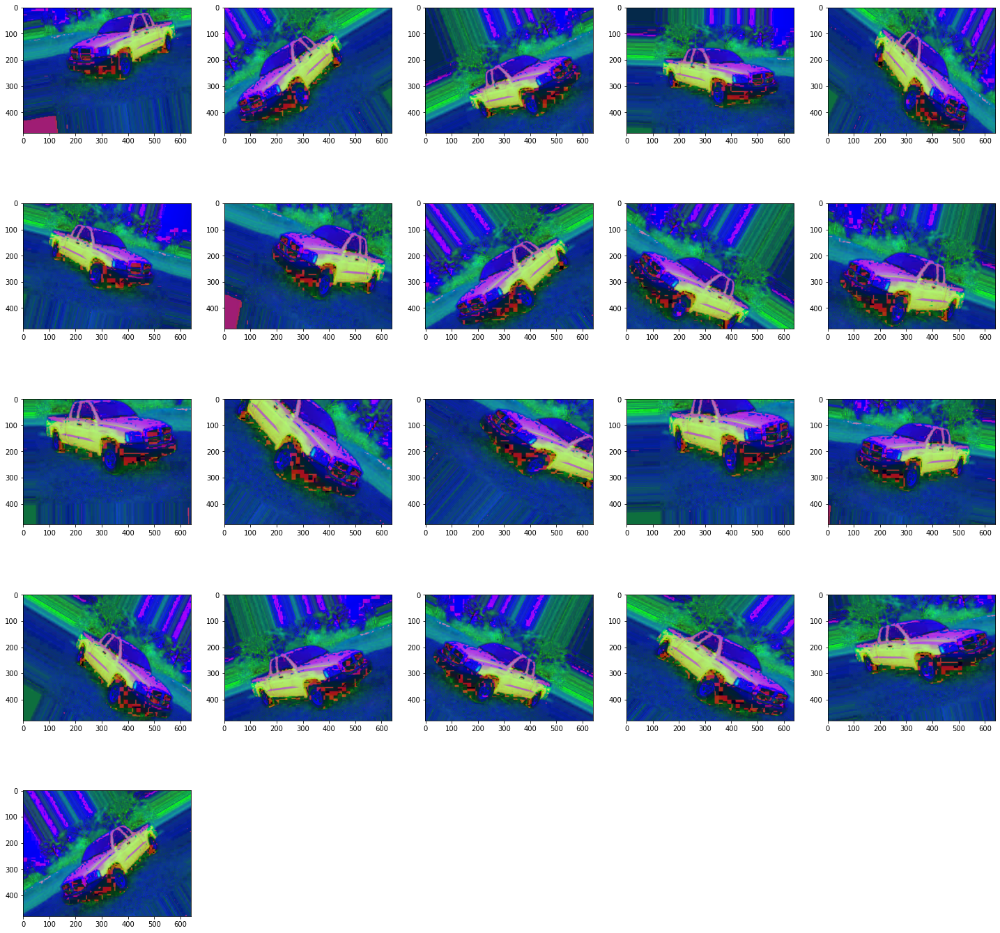

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(25,25)) # specifying the overall grid size

for i in range(len(aug_data)):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(aug_data[i])

plt.show()

In [ ]:
df_train.head(5)

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900
2,2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2007,480,640
3,3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,1386,2100
4,4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2012,108,144


In [ ]:
x = df_train.iloc[3][2]
x

621

	
x1 (number) – X-coordinate of the top left of the bounding box.
y1 (number) – Y-coordinate of the top left of the bounding box.
x2 (number) – X-coordinate of the bottom right of the bounding box.
y2 (number) – Y-coordinate of the bottom right of the bounding box.

In [91]:
import cv2
import os


In [92]:
import os
cwd = os.getcwd()
cwd

'/content/drive/My Drive/CapstoneProject/Data/car_data/car_data/train'

In [75]:
os.chdir('/content/drive/MyDrive/CapstoneProject/Data/car_data/car_data/train')

In [43]:
def loadImages(path= "./train/*.*/"):
    return [os.path.join(path,f) for f in os.listdir(path) if f.endswith('.jpg')]

In [53]:
num = 0
for image in images:
    cv2.imwrite(str(num)+ ".jpg",image)
    num += 1


In [93]:
import imgaug as ia

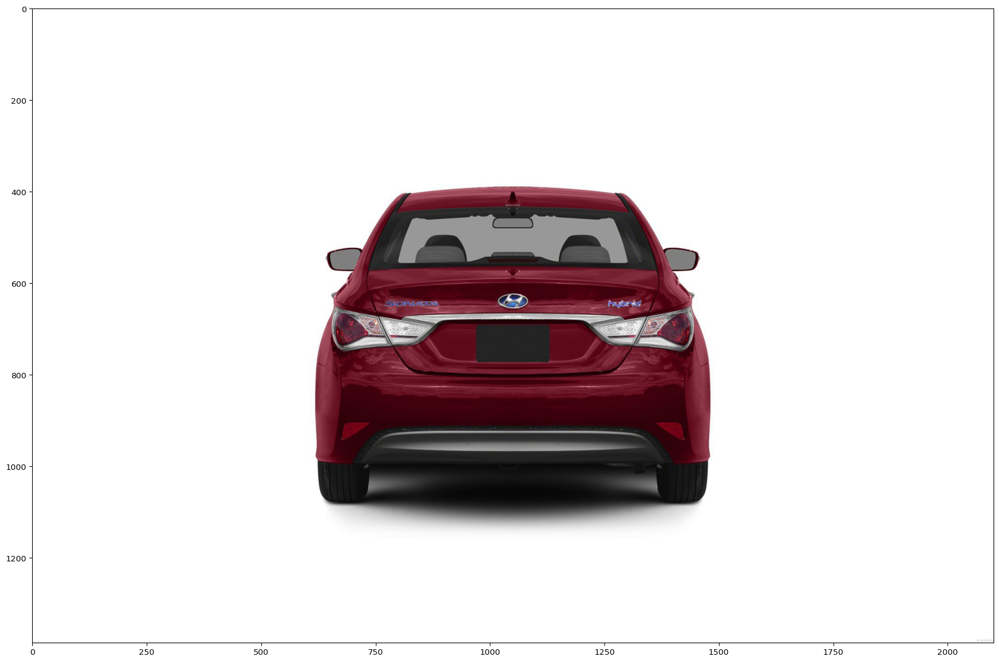

In [143]:
import imageio
image1 = imageio.imread(df_train.iloc[3][8])
ia.imshow(image1)

In [ ]:
cv2.imwrite(df_train.iloc[0][7]+ '_Aug'+ str(num)+ ".jpg",image1)

In [130]:
(df_train.iloc[3][7])

'Hyundai Sonata Hybrid Sedan 2012'

In [131]:
import imgaug.augmenters as iaa

In [25]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [103]:
num = 0
for image2 in images_aug:
    cv2.imwrite(str(num)+ ".jpg",image2)
    num += 1

In [144]:
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
bbs = BoundingBoxesOnImage([BoundingBox(x1=df_train.iloc[3][2], x2=df_train.iloc[3][4],y1=df_train.iloc[3][3],y2=df_train.iloc[3][5])],shape=image1.shape)

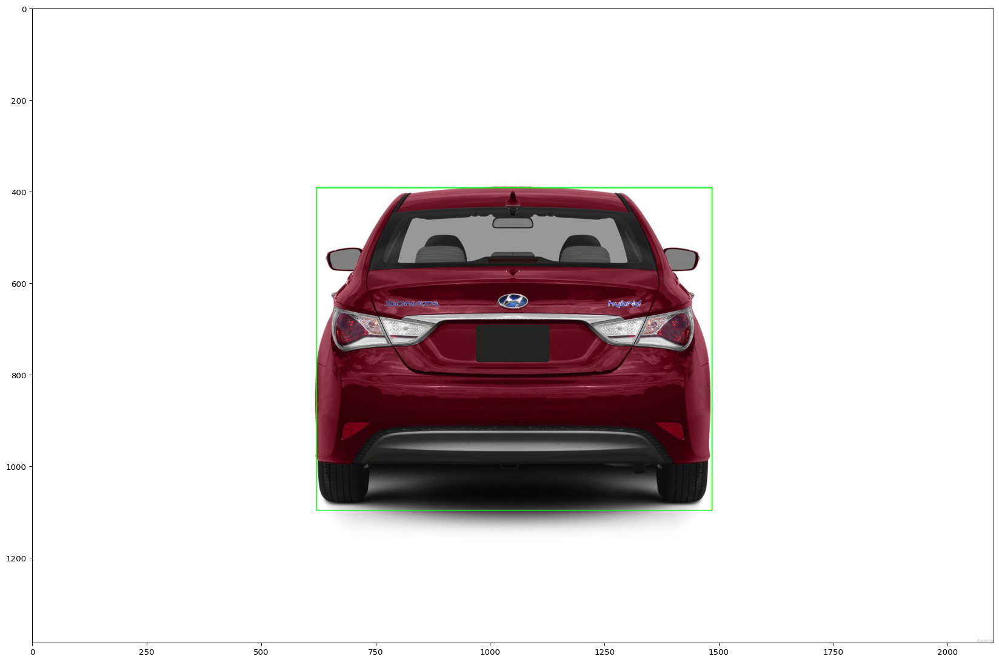

In [145]:
ia.imshow(bbs.draw_on_image(image1,size=2))

In [146]:
seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True)

# Augment BBs and images.
image_aug,bbs_aug = seq(image=image1,bounding_boxes=bbs)


# print coordinates before/after augmentation (see below)
# use .x1_int, .y_int, ... to get integer coordinates
for i in range(len(bbs.bounding_boxes)):
    before = bbs.bounding_boxes[i]
    after = bbs_aug.bounding_boxes[i]
    print("BB %d: (%.0f, %.0f, %.0f, %.0f) -> (%.0f, %.0f, %.0f, %.0f)" % (
        i,
        before.x1, before.y1, before.x2, before.y2,
        after.x1, after.y1, after.x2, after.y2)
    )

BB 0: (621, 393, 1484, 1096) -> (89, 512, 1342, 1409)


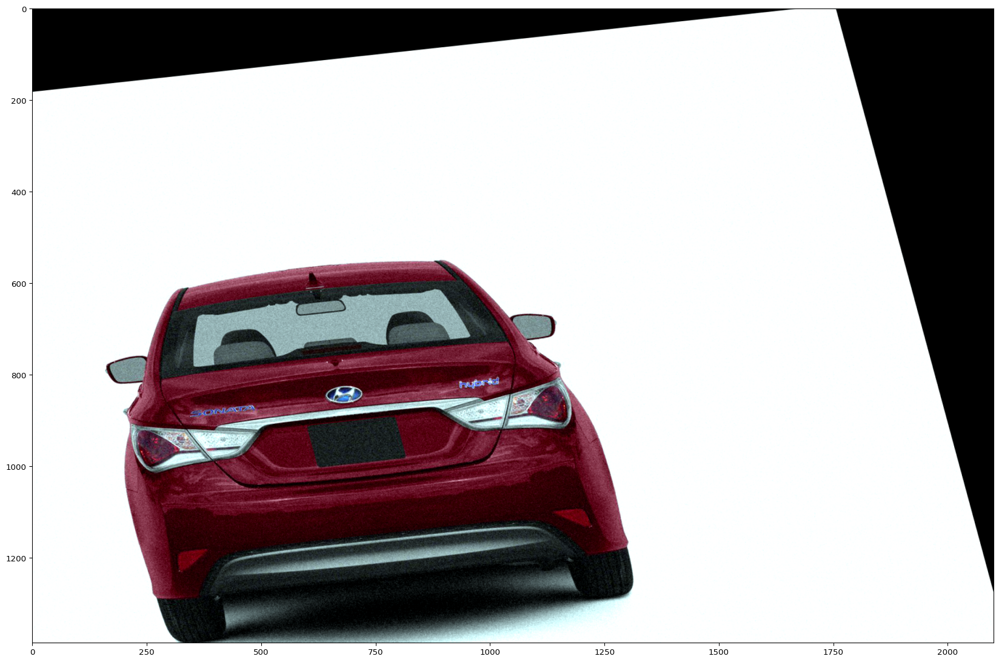

In [147]:
ia.imshow(image_aug)

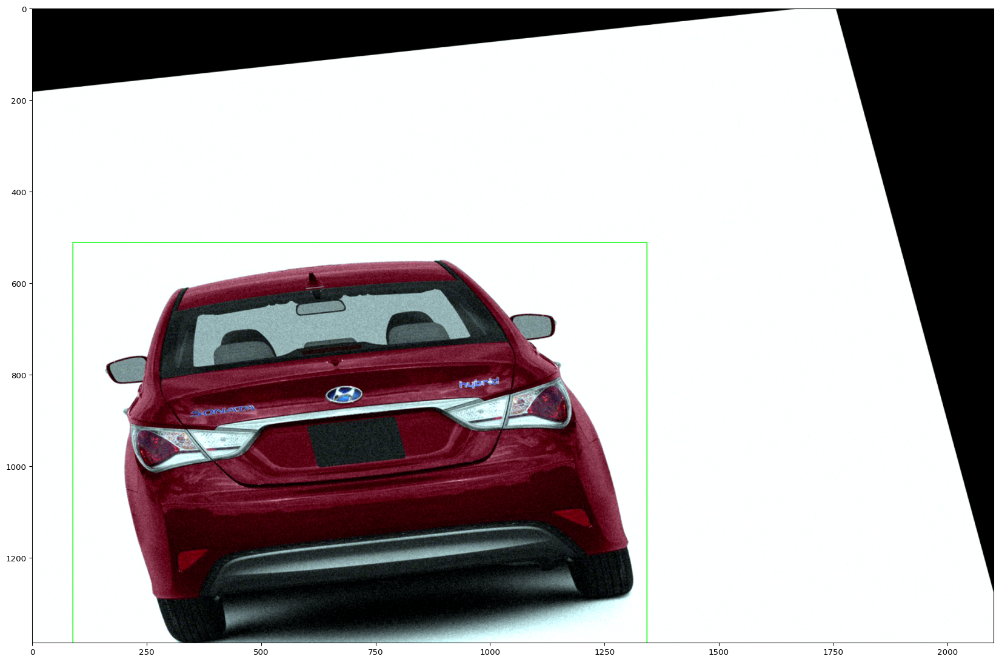

In [149]:
ia.imshow(bbs_aug.draw_on_image(image_aug,size=2))

In [150]:
def pad(image,by):
    image_border1 = ia.pad(image,top=1,right=1,bottom=1,left=1,
                           mode="constant",cval=255)
    image_border2 = ia.pad(image_border1,top=by-1,right=by-1,bottom=by-1,left=by-1,
                           mode="constant",cval=0)
    return image_border2


In [151]:
def draw_bbs(image,bbs,border):
    GREEN = [0,255,0]
    ORANGE = [255,140,0]
    RED = [255,0,0]
    image_border = pad(image,border)
    for bb in bbs.bounding_boxes:
        if bb.is_fully_within_image(image.shape):
           colour = GREEN
        elif bb.is_partly_within_image(image.shape):
           colour = ORANGE
        else:
           colour = RED
        image_border = bb.shift(left=border,top =border)\
                      .draw_on_image(image_border,size=2,color=colour)
    return image_border

In [152]:
image_after = draw_bbs(image_aug,bbs_aug.remove_out_of_image().clip_out_of_image(),100)

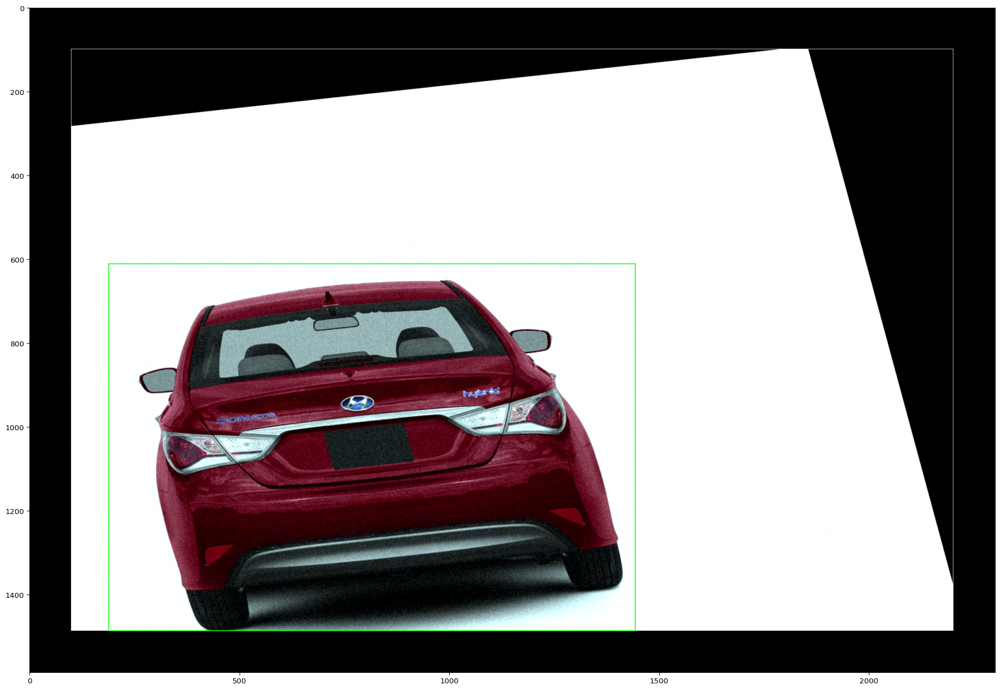

In [153]:
ia.imshow(image_after)

In [141]:
image_aug, bbs_aug = seq(image=image_after, bounding_boxes=bbs)

In [154]:
for i in range(len(bbs.bounding_boxes)):
    before = bbs.bounding_boxes[i]
    after = bbs_aug.bounding_boxes[i]
    print("BB %d: (%.0f, %.0f, %.0f, %.0f) -> (%.0f, %.0f, %.0f, %.0f)" % (
        i,
        before.x1, before.y1, before.x2, before.y2,
        after.x1, after.y1, after.x2, after.y2)
    )

BB 0: (621, 393, 1484, 1096) -> (89, 512, 1342, 1409)


In [55]:
imageio.imwrite(os.path.join(path, path + "%06d.jpg" % (i,)), image_aug)

In [128]:
df_train.head(5)

,Unnamed: 0,Image,x0,y0,x1,y1,Car_ref,Car_name,File_loc,Car_type,Year,Height,Width
0,0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Coupe,2012,400,600
1,1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,675,900
2,2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2007,480,640
3,3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Sedan,2012,1386,2100
4,4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,/content/drive/MyDrive/CapstoneProject/Data/ca...,Cab,2012,108,144


In [121]:
len(df_train)

8144

In [190]:
path = ('/content/drive/MyDrive/CapstoneProject/Data/Augmented')
aug_bbs = [0,0,0,0]
i=0
num=8145
for i in range(10):
    image_name = df_train.iloc[i][8]
    image = imageio.imread(image_name)
    bbs = BoundingBoxesOnImage([BoundingBox(x1=df_train.iloc[i][2], x2=df_train.iloc[i][4],
                                                      y1=df_train.iloc[i][3],y2=df_train.iloc[i][5])],
                                          shape=image.shape)
    image_aug,bbs_aug = seq(image=image,bounding_boxes=bbs)
    image_after = draw_bbs(image_aug,bbs_aug.remove_out_of_image().clip_out_of_image(),100)
    file_name = df_train.iloc[i][1]
    imageio.imwrite(os.path.join(path, "%0d.jpg" %(num,)),image_after)
    num +=1

    

In [ ]:
path = ('/content/drive/MyDrive/CapstoneProject/Data/Augmented')
aug_bbs = [0,0,0,0]
i=0
num=8145
for i in range(10):
    image_name = df_train.iloc[i][8]
    image = imageio.imread(image_name)
    bbs = BoundingBoxesOnImage([BoundingBox(x1=df_train.iloc[i][2], x2=df_train.iloc[i][4],
                                                      y1=df_train.iloc[i][3],y2=df_train.iloc[i][5])],
                                          shape=image.shape)
    image_aug,bbs_aug = seq(image=image,bounding_boxes=bbs)
    bbs_aug.bounding_boxes
    image_after = draw_bbs(image_aug,bbs_aug.remove_out_of_image().clip_out_of_image(),100)
    file_name = df_train.iloc[i][1]
    imageio.imwrite(os.path.join(path, "%0d.jpg" %(num,)),image_after)
    num +=1

In [206]:
def bbs_obj_to_df(bbs_aug_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_aug_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs_aug = pd.DataFrame(bbs_array, columns=['x0', 'y0', 'x1', 'y1'])
    return df_bbs_aug

In [207]:
bbs_obj_to_df(bbs_aug)

,x0,y0,x1,y1
0,-125.513077,-109.240997,534.712585,392.143707
